<a href="https://colab.research.google.com/github/eveshi/covid19-policy-and-infection/blob/main/data_analysis_colab1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

### Get lagged data

According to the *Interim Estimates of Vaccine Effectiveness of BNT162b2 and mRNA-1273 COVID-19 Vaccines in Preventing SARS-CoV-2 Infection Among Health Care Personnel, First Responders, and Other Essential and Frontline Workers — Eight U.S. Locations, December 2020–March 2021* published by CDC, the effectiveness of vaccines has around 14 days lag. Thus, we will add two column **vaccine lag-7** and **vaccine lag-14** for our analysis.

In [ ]:
! pip3 install shap

In [ ]:
import pandas as pd
from sklearn.preprocessing import RobustScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score
import statsmodels.api as sm
from sklearn import svm
from sklearn.ensemble import RandomForestRegressor
from sklearn.datasets import make_regression
from sklearn.model_selection import RandomizedSearchCV
from sklearn.svm import SVR
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
import shap
import numpy as np
from sklearn.decomposition import PCA
from sklearn.linear_model import LinearRegression
from sklearn import tree
from sklearn.model_selection import GridSearchCV
import seaborn as sn

In [ ]:
data = pd.read_csv("data.csv")

In [ ]:
data.columns

Index(['Unnamed: 0', 'state', 'date',
       'retail_and_recreation_percent_change_from_baseline',
       'grocery_and_pharmacy_percent_change_from_baseline',
       'parks_percent_change_from_baseline',
       'transit_stations_percent_change_from_baseline',
       'workplaces_percent_change_from_baseline',
       'residential_percent_change_from_baseline', 'stay_at_home',
       'mask_mandate', 'business_open', 'people_fully_vaccinated_per_hundred',
       'daily_vaccinations_per_million', 'submission_date', 'state_abbr',
       'new_case', 'new_case_ma7', 'new_death', 'new_death_ma7',
       'population_density', 'population', 'new_death_growth_rate',
       'new_case_growth_rate', 'new_death_growth_rate_weekly',
       'new_case_growth_rate_weekly', 'new_death_pct', 'new_case_pct'],
      dtype='object')

In [ ]:
min(data["date"])

'2021-01-01'

In [ ]:
max(data["date"])

'2021-04-20'

In [ ]:
data = data.replace("no value", None)

In [ ]:
data["retail_and_recreation_percent_change_from_baseline"] = data["retail_and_recreation_percent_change_from_baseline"] / 100
data["grocery_and_pharmacy_percent_change_from_baseline"] = data["grocery_and_pharmacy_percent_change_from_baseline"] / 100
data["parks_percent_change_from_baseline"] = data["parks_percent_change_from_baseline"].astype(float) / 100
data["transit_stations_percent_change_from_baseline"] = data["transit_stations_percent_change_from_baseline"] / 100
data["workplaces_percent_change_from_baseline"] = data["workplaces_percent_change_from_baseline"] / 100
data["residential_percent_change_from_baseline"] = data["residential_percent_change_from_baseline"] / 100

In [ ]:
new_data = pd.DataFrame()
for state in data["state"].unique():
    s = data[data["state"] == state]
    s["people_fully_vaccinated_per_hundred_lag7"] = s["people_fully_vaccinated_per_hundred"].shift(7)
    s["people_fully_vaccinated_per_hundred_lag14"] = s["people_fully_vaccinated_per_hundred"].shift(14)
    s["daily_vaccinations_per_million_lag7"] = s["daily_vaccinations_per_million"].shift(7)
    s["daily_vaccinations_per_million_lag14"] = s["daily_vaccinations_per_million"].shift(14)
    s["retail_and_recreation_percent_change_lag7"] = s["retail_and_recreation_percent_change_from_baseline"].shift(7)
    s["grocery_and_pharmacy_percent_change_lag7"] = s["grocery_and_pharmacy_percent_change_from_baseline"].shift(7)
    s["parks_percent_change_lag7"] = s["parks_percent_change_from_baseline"].shift(7)
    s["transit_stations_percent_change_lag7"] = s["transit_stations_percent_change_from_baseline"].shift(7)
    s["workplaces_percent_change_lag7"] = s["workplaces_percent_change_from_baseline"].shift(7)
    s["residential_percent_change_lag7"] = s["residential_percent_change_from_baseline"].shift(7)
    s["retail_and_recreation_percent_change_lag14"] = s["retail_and_recreation_percent_change_from_baseline"].shift(7)
    s["grocery_and_pharmacy_percent_change_lag14"] = s["grocery_and_pharmacy_percent_change_from_baseline"].shift(7)
    s["parks_percent_change_lag14"] = s["parks_percent_change_from_baseline"].shift(7)
    s["transit_stations_percent_change_lag14"] = s["transit_stations_percent_change_from_baseline"].shift(7)
    s["workplaces_percent_change_lag14"] = s["workplaces_percent_change_from_baseline"].shift(7)
    s["residential_percent_change_lag14"] = s["residential_percent_change_from_baseline"].shift(7)
    new_data = new_data.append(s)


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/

In [ ]:
new_data = new_data[pd.to_datetime(new_data["date"]) > pd.to_datetime("01/01/2021")]

In [ ]:
new_data.describe()

,Unnamed: 0,retail_and_recreation_percent_change_from_baseline,grocery_and_pharmacy_percent_change_from_baseline,parks_percent_change_from_baseline,transit_stations_percent_change_from_baseline,workplaces_percent_change_from_baseline,residential_percent_change_from_baseline,stay_at_home,mask_mandate,business_open,people_fully_vaccinated_per_hundred,daily_vaccinations_per_million,new_case,new_case_ma7,new_death,new_death_ma7,population_density,population,new_death_growth_rate,new_case_growth_rate,new_death_growth_rate_weekly,new_case_growth_rate_weekly,new_death_pct,new_case_pct,people_fully_vaccinated_per_hundred_lag7,people_fully_vaccinated_per_hundred_lag14,daily_vaccinations_per_million_lag7,daily_vaccinations_per_million_lag14,retail_and_recreation_percent_change_lag7,grocery_and_pharmacy_percent_change_lag7,parks_percent_change_lag7,transit_stations_percent_change_lag7,workplaces_percent_change_lag7,residential_percent_change_lag7,retail_and_recreation_percent_change_lag14,grocery_and_pharmacy_percent_change_lag14,parks_percent_change_lag14,transit_stations_percent_change_lag14,workplaces_percent_change_lag14,residential_percent_change_lag14
count,5559.000000,5559.000000,5559.000000,5559.000000,5559.000000,5559.000000,5559.000000,5559.000000,5559.000000,5559.000000,4689.000000,4900.000000,5559.000000,5559.000000,5559.000000,5559.000000,5559.000000,5.559000e+03,5559.000000,5559.000000,5553.000000,5553.000000,5559.000000,5559.000000,4339.000000,3989.000000,4550.000000,4200.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000
mean,2805.000000,-0.156008,-0.068550,0.050149,-0.243828,-0.251599,0.083562,0.019608,0.693110,0.348804,10.382367,6185.196531,1951.444325,2028.817336,35.411405,36.674607,86.043562,6.436069e+06,inf,-0.007675,inf,0.673917,0.000005,0.000292,9.164796,8.043144,5944.702857,5674.056429,-0.165513,-0.075490,0.024649,-0.254146,-0.258011,0.087175,-0.165513,-0.075490,0.024649,-0.254146,-0.258011,0.087175
std,1619.607526,0.133389,0.094471,0.381044,0.197465,0.114062,0.046567,0.138661,0.461245,0.496963,8.070154,2656.687317,3612.077418,3545.809978,69.118568,62.011642,331.939366,7.288795e+06,NaN,0.071816,NaN,8.368305,0.000004,0.000214,7.033739,6.104959,2500.782601,2314.736772,0.135472,0.098037,0.362647,0.197182,0.123942,0.049649,0.135472,0.098037,0.362647,0.197182,0.123942,0.049649
min,1.000000,-0.790000,-0.660000,-0.760000,-0.840000,-0.860000,-0.040000,0.000000,0.000000,0.000000,0.000000,0.000000,-9549.000000,38.571429,-174.000000,-18.000000,0.081129,5.787590e+05,-4.571429,-0.559012,-35.000000,-0.914743,-0.000006,0.000027,0.000000,0.000000,0.000000,0.000000,-0.790000,-0.660000,-0.760000,-0.870000,-0.860000,-0.040000,-0.790000,-0.660000,-0.760000,-0.870000,-0.860000,-0.040000
25%,1402.500000,-0.230000,-0.120000,-0.210000,-0.390000,-0.320000,0.050000,0.000000,0.000000,0.000000,2.980000,4066.750000,279.000000,327.500000,2.000000,5.000000,8.705079,1.787065e+06,-0.057692,-0.038969,-0.255365,-0.199413,0.000002,0.000144,2.655000,2.380000,3940.000000,3806.000000,-0.240000,-0.130000,-0.220000,-0.400000,-0.330000,0.050000,-0.240000,-0.130000,-0.220000,-0.400000,-0.330000,0.050000
50%,2805.000000,-0.150000,-0.070000,-0.040000,-0.240000,-0.250000,0.080000,0.000000,1.000000,0.000000,8.930000,6016.000000,817.000000,919.000000,11.000000,15.142857,20.849967,4.467673e+06,0.000000,-0.010080,-0.090909,-0.074816,0.000004,0.000212,8.100000,7.070000,5816.000000,5523.000000,-0.160000,-0.070000,-0.050000,-0.250000,-0.250000,0.080000,-0.160000,-0.070000,-0.050000,-0.250000,-0.250000,0.080000
75%,4207.500000,-0.070000,-0.010000,0.220000,-0.110000,-0.170000,0.110000,0.000000,1.000000,1.000000,16.180000,7914.500000,2257.500000,2420.928571,39.000000,41.428571,49.720279,7.614893e+06,0.032258,0.018295,0.142857,0.089735,0.000007,0.000381,14.425000,12.800000,7631.500000,7318.250000,-0.080000,-0.020000,0.190000,-0.120000,-0.170000,0.110000,-0.080000,-0.02000

In [ ]:
import matplotlib.pyplot as plt

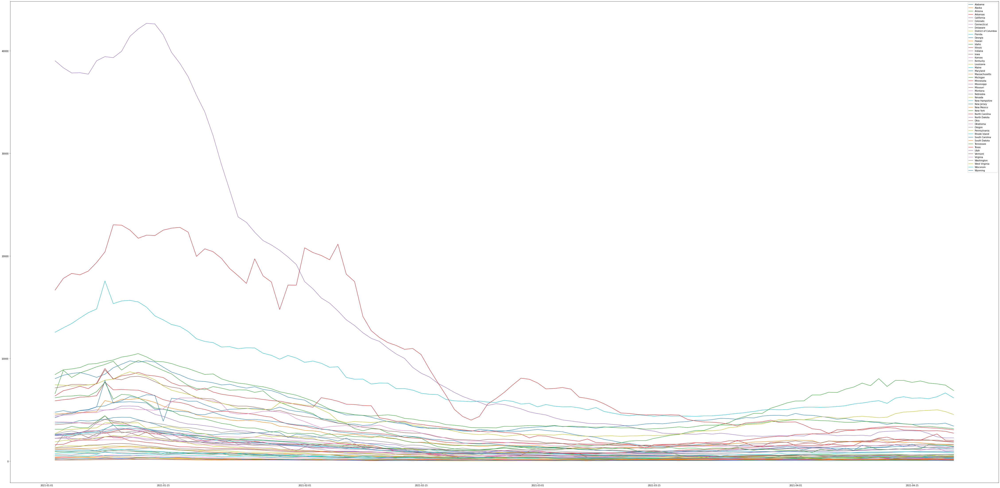

In [ ]:
fig= plt.figure(figsize=(80,40))

for state in new_data["state"].unique():
    sub = new_data[new_data["state"] == state]

    x = pd.to_datetime(sub["date"])
    y = sub["new_case_ma7"]

    plt.plot(x, y, label = state)

plt.legend()

plt.show()

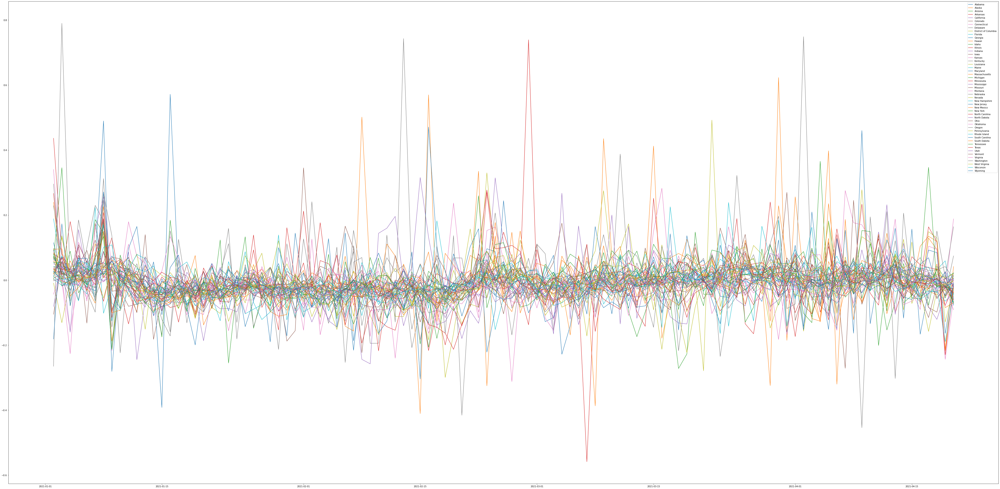

In [ ]:
fig= plt.figure(figsize=(80,40))

for state in new_data["state"].unique():
    sub = new_data[new_data["state"] == state]

    x = pd.to_datetime(sub["date"])
    y = sub["new_case_growth_rate"]

    plt.plot(x, y, label = state)

plt.legend()

plt.show()

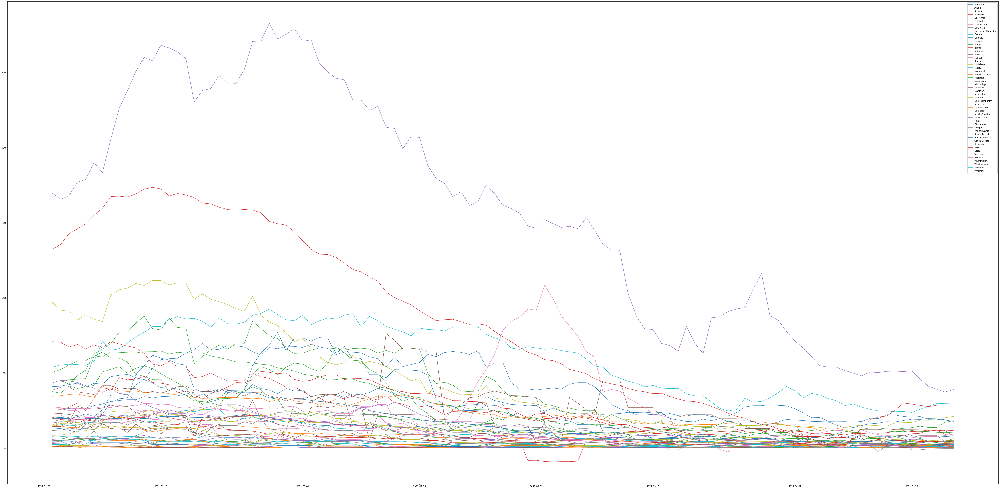

In [ ]:
fig= plt.figure(figsize=(80,40))

for state in new_data["state"].unique():
    sub = new_data[new_data["state"] == state]

    x = pd.to_datetime(sub["date"])
    y = sub["new_death_ma7"]

    plt.plot(x, y, label = state)

plt.legend()

plt.show()

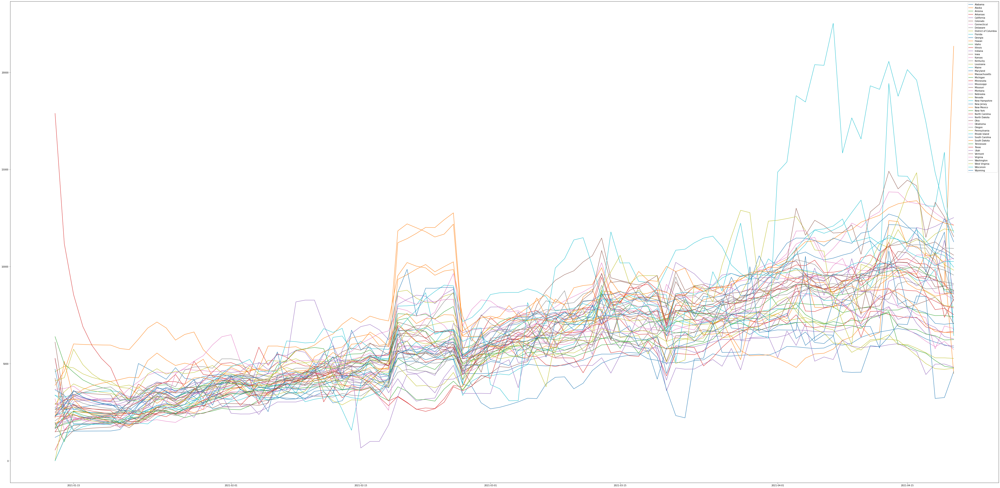

In [ ]:
fig= plt.figure(figsize=(80,40))

for state in new_data["state"].unique():
    sub = new_data[new_data["state"] == state]

    x = pd.to_datetime(sub["date"])
    y = sub["daily_vaccinations_per_million"]

    plt.plot(x, y, label = state)

plt.legend()

plt.show()

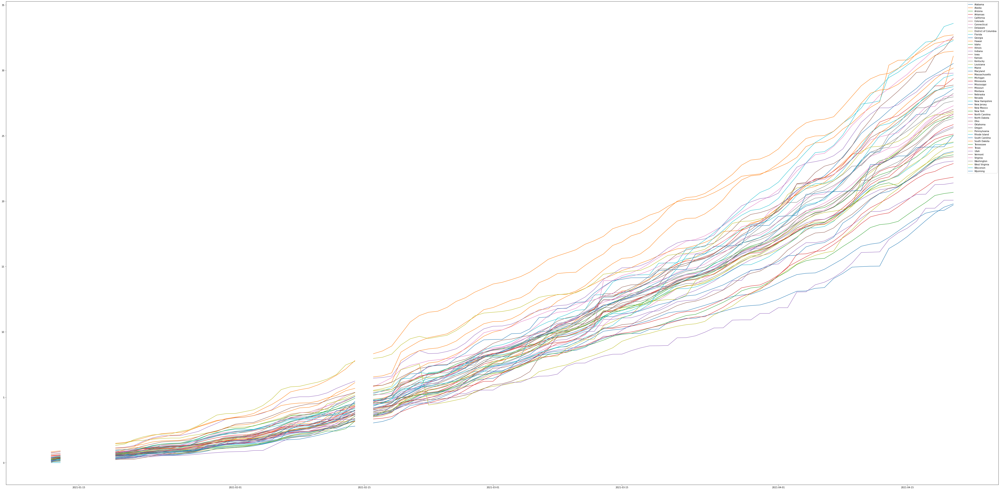

In [ ]:
fig= plt.figure(figsize=(80,40))

for state in new_data["state"].unique():
    sub = new_data[new_data["state"] == state]

    x = pd.to_datetime(sub["date"])
    y = sub["people_fully_vaccinated_per_hundred"]

    plt.plot(x, y, label = state)

plt.legend()

plt.show()

In [ ]:
len(new_data)

5559

In [ ]:
data_without_na = new_data.dropna()

In [ ]:
data_without_na.columns

Index(['Unnamed: 0', 'state', 'date',
       'retail_and_recreation_percent_change_from_baseline',
       'grocery_and_pharmacy_percent_change_from_baseline',
       'parks_percent_change_from_baseline',
       'transit_stations_percent_change_from_baseline',
       'workplaces_percent_change_from_baseline',
       'residential_percent_change_from_baseline', 'stay_at_home',
       'mask_mandate', 'business_open', 'people_fully_vaccinated_per_hundred',
       'daily_vaccinations_per_million', 'submission_date', 'state_abbr',
       'new_case', 'new_case_ma7', 'new_death', 'new_death_ma7',
       'population_density', 'population', 'new_death_growth_rate',
       'new_case_growth_rate', 'new_death_growth_rate_weekly',
       'new_case_growth_rate_weekly', 'new_death_pct', 'new_case_pct',
       'people_fully_vaccinated_per_hundred_lag7',
       'people_fully_vaccinated_per_hundred_lag14',
       'daily_vaccinations_per_million_lag7',
       'daily_vaccinations_per_million_lag14',
       

### Policy and mobility

In [ ]:
mob = ['retail_and_recreation_percent_change_from_baseline',
       'grocery_and_pharmacy_percent_change_from_baseline',
       'parks_percent_change_from_baseline',
       'transit_stations_percent_change_from_baseline',
       'workplaces_percent_change_from_baseline',
       'residential_percent_change_from_baseline']
pol = ['stay_at_home',
       'mask_mandate', 'business_open']

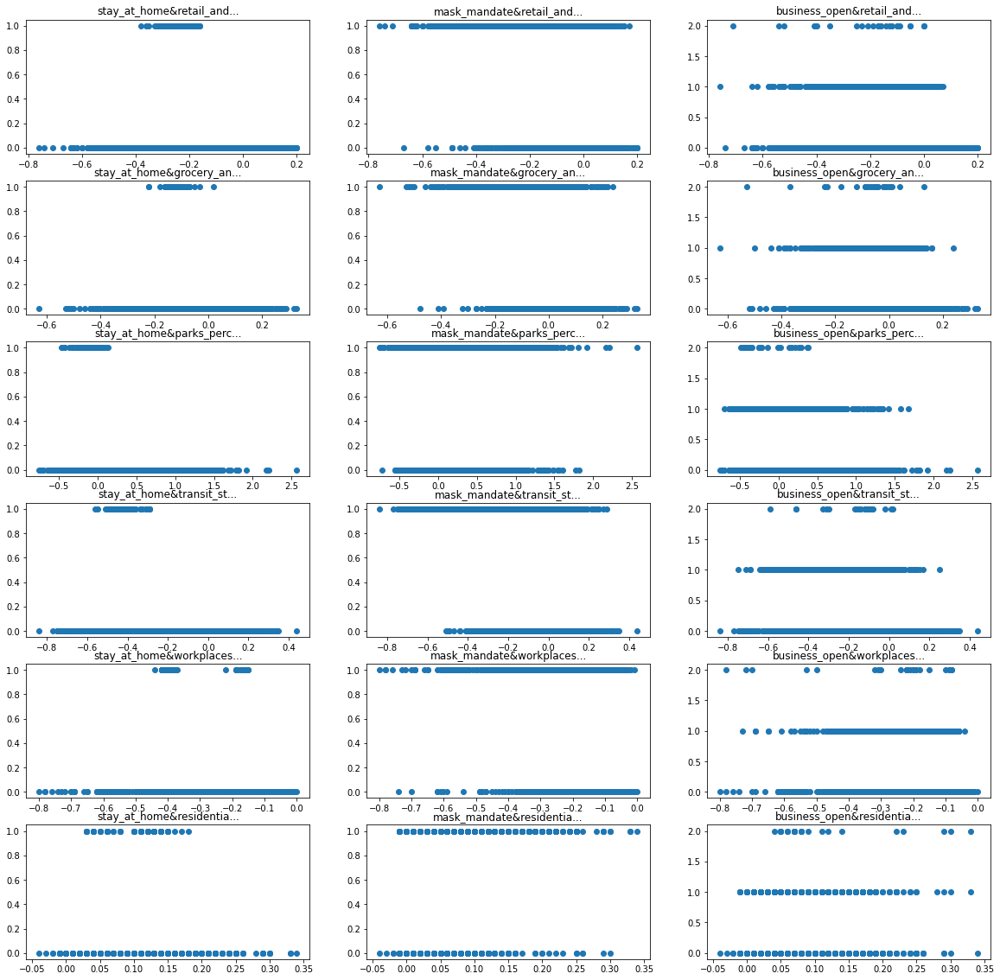

In [ ]:
fig = plt.figure(figsize=(20, 20))
axs = fig.subplots(len(mob), len(pol))
for i in range(0, len(pol)):
    for j in range(0, len(mob)):
        axs[j, i].scatter(data_without_na[mob[j]], data_without_na[pol[i]])
        axs[j, i].set_title(pol[i]+"&"+mob[j][:10]+"...")

plt.show()

### Correlation matrix

In [ ]:
columns = ['retail_and_recreation_percent_change_from_baseline',
       'grocery_and_pharmacy_percent_change_from_baseline',
       'parks_percent_change_from_baseline',
       'transit_stations_percent_change_from_baseline',
       'workplaces_percent_change_from_baseline',
       'residential_percent_change_from_baseline']

In [ ]:
X = data_without_na[columns]

In [ ]:
X.corr()

,retail_and_recreation_percent_change_from_baseline,grocery_and_pharmacy_percent_change_from_baseline,parks_percent_change_from_baseline,transit_stations_percent_change_from_baseline,workplaces_percent_change_from_baseline,residential_percent_change_from_baseline
retail_and_recreation_percent_change_from_baseline,1.000000,0.868974,0.617132,0.808386,0.524715,-0.723859
grocery_and_pharmacy_percent_change_from_baseline,0.868974,1.000000,0.596800,0.713260,0.500764,-0.681891
parks_percent_change_from_baseline,0.617132,0.596800,1.000000,0.486756,0.325315,-0.574889
transit_stations_percent_change_from_baseline,0.808386,0.713260,0.486756,1.000000,0.603781,-0.746291
workplaces_percent_change_from_baseline,0.524715,0.500764,0.325315,0.603781,1.000000,-0.858674
residential_percent_change_from_baseline,-0.723859,-0.681891,-0.574889,-0.746291,-0.858674,1.000000


In [ ]:
corr = X.corr()

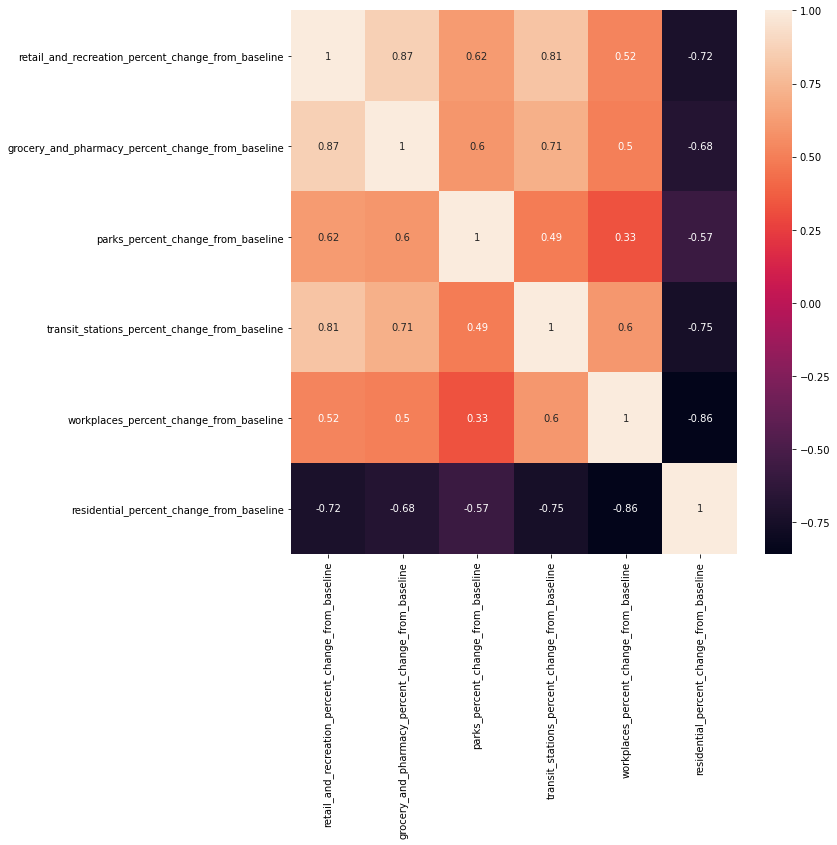

In [ ]:
fig= plt.figure(figsize=(10,10))

sn.heatmap(corr, annot=True)
plt.show()

In [ ]:
for i in range(corr.shape[0]):
    for j in range(i+1, corr.shape[0]):
        if abs(corr.iloc[i,j]) >= 0.85:
            print(i, j, columns[i], columns[j], corr.iloc[i,j])

0 1 retail_and_recreation_percent_change_from_baseline grocery_and_pharmacy_percent_change_from_baseline 0.8689741130830179
4 5 workplaces_percent_change_from_baseline residential_percent_change_from_baseline -0.8586742050134736


### Mobility feature selection

In [ ]:
Y2 = data_without_na["new_case_growth_rate"]

In [ ]:
columns = ['retail_and_recreation_percent_change_from_baseline',
       'grocery_and_pharmacy_percent_change_from_baseline',
       'parks_percent_change_from_baseline',
       'transit_stations_percent_change_from_baseline',
       'workplaces_percent_change_from_baseline',
       'residential_percent_change_from_baseline',
       'retail_and_recreation_percent_change_lag7',
       'grocery_and_pharmacy_percent_change_lag7', 'parks_percent_change_lag7',
       'transit_stations_percent_change_lag7',
       'workplaces_percent_change_lag7', 'residential_percent_change_lag7',
       'retail_and_recreation_percent_change_lag14',
       'grocery_and_pharmacy_percent_change_lag14',
       'parks_percent_change_lag14', 'transit_stations_percent_change_lag14',
       'workplaces_percent_change_lag14', 'residential_percent_change_lag14'
       ]
features = len(columns)
c = columns.copy()

In [ ]:
X = data_without_na[c]
scaler = RobustScaler() 
X_scaled = scaler.fit_transform(X)

In [ ]:
regressor_OLS = sm.OLS(Y2, X_scaled).fit()
for i in range(len(columns)):
    print(columns[i], regressor_OLS.pvalues[i])

retail_and_recreation_percent_change_from_baseline 3.5418877010986394e-05
grocery_and_pharmacy_percent_change_from_baseline 0.0006483864135941506
parks_percent_change_from_baseline 0.19440943107662662
transit_stations_percent_change_from_baseline 0.040215955397942905
workplaces_percent_change_from_baseline 0.3836170699833644
residential_percent_change_from_baseline 8.06945749265598e-06
retail_and_recreation_percent_change_lag7 0.8983554722413467
grocery_and_pharmacy_percent_change_lag7 0.010043562489882599
parks_percent_change_lag7 0.06978735586428372
transit_stations_percent_change_lag7 0.9970999424647391
workplaces_percent_change_lag7 0.003290309606621263
residential_percent_change_lag7 0.05754428078632142
retail_and_recreation_percent_change_lag14 0.8983554722413417
grocery_and_pharmacy_percent_change_lag14 0.010043562489883065
parks_percent_change_lag14 0.06978735586428521
transit_stations_percent_change_lag14 0.997099942464739
workplaces_percent_change_lag14 0.0032903096066213013


In [ ]:
for i in range(0, features):
    X = data_without_na[c]
    scaler = RobustScaler() 
    X_scaled = scaler.fit_transform(X)
    regressor_OLS = sm.OLS(Y2, X_scaled).fit()
    maxVar = max(regressor_OLS.pvalues)
    if maxVar > 0.05:
        for j in range(0, features - i):
            if (regressor_OLS.pvalues[j].astype(float) == maxVar):
                print(maxVar, c[j])
                c = np.delete(c, j)
    if maxVar <= 0.05:
        break
                
print(regressor_OLS.summary())
for i in range(len(c)):
    print(c[i], regressor_OLS.pvalues[i])


0.9970999424647391 transit_stations_percent_change_lag7
0.9970999424647412 transit_stations_percent_change_lag14
0.8858277404910014 retail_and_recreation_percent_change_lag7
0.8858277404910014 retail_and_recreation_percent_change_lag14
0.31834696940630147 workplaces_percent_change_from_baseline
                                  OLS Regression Results                                 
Dep. Variable:     new_case_growth_rate   R-squared (uncentered):                   0.055
Model:                              OLS   Adj. R-squared (uncentered):              0.053
Method:                   Least Squares   F-statistic:                              24.69
Date:                  Tue, 27 Apr 2021   Prob (F-statistic):                    1.32e-41
Time:                          05:00:30   Log-Likelihood:                          4754.9
No. Observations:                  3845   AIC:                                     -9492.
Df Residuals:                      3836   BIC:                            

In [ ]:
selected_mob_column = ['retail_and_recreation_percent_change_from_baseline',
       'transit_stations_percent_change_from_baseline',
       'residential_percent_change_from_baseline']

In [ ]:
new_data = pd.concat([new_data, pd.get_dummies(new_data["business_open"], prefix="business_open")], axis=1)
new_data.columns

Index(['Unnamed: 0', 'state', 'date',
       'retail_and_recreation_percent_change_from_baseline',
       'grocery_and_pharmacy_percent_change_from_baseline',
       'parks_percent_change_from_baseline',
       'transit_stations_percent_change_from_baseline',
       'workplaces_percent_change_from_baseline',
       'residential_percent_change_from_baseline', 'stay_at_home',
       'mask_mandate', 'business_open', 'people_fully_vaccinated_per_hundred',
       'daily_vaccinations_per_million', 'submission_date', 'state_abbr',
       'new_case', 'new_case_ma7', 'new_death', 'new_death_ma7',
       'population_density', 'new_death_growth_rate', 'new_case_growth_rate',
       'people_fully_vaccinated_per_hundred_lag7',
       'people_fully_vaccinated_per_hundred_lag14',
       'daily_vaccinations_per_million_lag7',
       'daily_vaccinations_per_million_lag14', 'business_open_0',
       'business_open_1', 'business_open_2'],
      dtype='object')

### Vaccine feature selection

In [ ]:
columns = ['people_fully_vaccinated_per_hundred',
       'daily_vaccinations_per_million',
        'people_fully_vaccinated_per_hundred_lag7',
       'people_fully_vaccinated_per_hundred_lag14',
       'daily_vaccinations_per_million_lag7',
       'daily_vaccinations_per_million_lag14']
features = len(columns)
c = columns.copy()

In [ ]:
X = data_without_na[c]
scaler = RobustScaler() 
X_scaled = scaler.fit_transform(X)

In [ ]:
regressor_OLS = sm.OLS(Y2, X_scaled).fit()
for i in range(len(columns)):
    print(columns[i], regressor_OLS.pvalues[i])

people_fully_vaccinated_per_hundred 0.39659801158665087
daily_vaccinations_per_million 0.043473091991058206
people_fully_vaccinated_per_hundred_lag7 0.25038844690940354
people_fully_vaccinated_per_hundred_lag14 0.434701445660268
daily_vaccinations_per_million_lag7 0.9965773889866342
daily_vaccinations_per_million_lag14 0.10299314713622691


In [ ]:
for i in range(0, features):
    X = data_without_na[c]
    scaler = RobustScaler() 
    X_scaled = scaler.fit_transform(X)
    regressor_OLS = sm.OLS(Y2, X_scaled).fit()
    maxVar = max(regressor_OLS.pvalues)
    if maxVar > 0.05:
        for j in range(0, features - i):
            if (regressor_OLS.pvalues[j].astype(float) == maxVar):
                print(maxVar, c[j])
                c = np.delete(c, j)
    if maxVar <= 0.05:
        break
                
print(regressor_OLS.summary())
for i in range(len(c)):
    print(c[i], regressor_OLS.pvalues[i])

0.9965773889866342 daily_vaccinations_per_million_lag7
0.38636902237944226 people_fully_vaccinated_per_hundred
0.4504800308400775 people_fully_vaccinated_per_hundred_lag14
0.07416294918697963 daily_vaccinations_per_million_lag14
                                  OLS Regression Results                                 
Dep. Variable:     new_case_growth_rate   R-squared (uncentered):                   0.027
Model:                              OLS   Adj. R-squared (uncentered):              0.027
Method:                   Least Squares   F-statistic:                              53.43
Date:                  Tue, 27 Apr 2021   Prob (F-statistic):                    1.29e-23
Time:                          03:49:00   Log-Likelihood:                          4699.4
No. Observations:                  3845   AIC:                                     -9395.
Df Residuals:                      3843   BIC:                                     -9382.
Df Model:                             2            

In [ ]:
from sklearn.preprocessing import PolynomialFeatures

In [ ]:
poly = PolynomialFeatures(degree = 3)
c = columns.copy()

In [ ]:
for v in c:
    X = data_without_na[[v]]
    scaler = RobustScaler() 
    X_scaled = scaler.fit_transform(X)
    X_poly = poly.fit_transform(X_scaled)
    regressor_OLS = sm.OLS(Y2, X_poly).fit()
    print(v)
    print(regressor_OLS.summary())

people_fully_vaccinated_per_hundred
                             OLS Regression Results                             
Dep. Variable:     new_case_growth_rate   R-squared:                       0.048
Model:                              OLS   Adj. R-squared:                  0.047
Method:                   Least Squares   F-statistic:                     64.60
Date:                  Tue, 27 Apr 2021   Prob (F-statistic):           9.55e-41
Time:                          03:49:00   Log-Likelihood:                 4759.4
No. Observations:                  3845   AIC:                            -9511.
Df Residuals:                      3841   BIC:                            -9486.
Df Model:                             3                                         
Covariance Type:              nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------

In [ ]:
select_vac_column = ["people_fully_vaccinated_per_hundred_lag7"]

## General analysis

In [ ]:
scaler = RobustScaler() 

In [ ]:
c = select_vac_column + selected_mob_column + pol + ["population_density"]

In [ ]:
X = data_without_na[c]
X_scaled = scaler.fit_transform(X)
X_scaled_df = pd.DataFrame(X_scaled, columns = X.columns)
X_train, X_test, y_train, y_test = train_test_split(X_scaled_df, Y2, test_size=0.2, random_state=42)

In [ ]:
model = LinearRegression().fit(X_train, y_train)

In [ ]:
y_pred = model.predict(X_test)
r2_score(y_test, y_pred)

0.03663909603944615

In [ ]:
explainer = shap.LinearExplainer(model, X_train)
shap_values = explainer.shap_values(X_test)

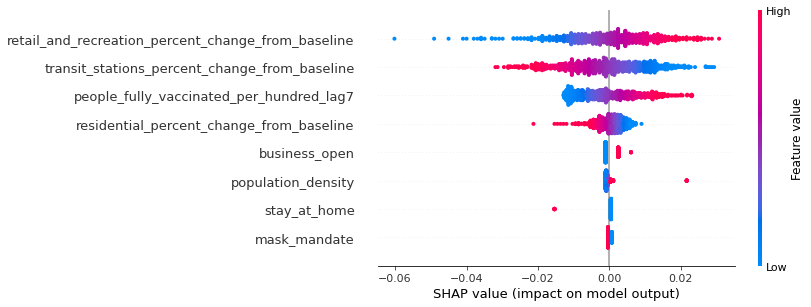

In [ ]:
shap.summary_plot(shap_values, X_test)

### Desicion Tree

In [ ]:
cols = c.copy()
X = data_without_na[cols]
X_train, X_test, y_train, y_test = train_test_split(X, Y2, test_size=0.2, random_state=42)

In [ ]:
clf = tree.DecisionTreeRegressor(random_state=42)

In [ ]:
grid = {'criterion': ["mse", "friedman_mse", "mae", "poisson"],
               'max_features': ['auto', 'sqrt'],
               'max_depth': range(2, 13),
               'min_samples_leaf': [1, 2, 4],}

In [ ]:
clf_random = GridSearchCV(estimator = clf, param_grid = grid, cv = 3, n_jobs = -2)

In [ ]:
clf_random.fit(X_train, y_train)

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
KeyError: 'poisson'

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
KeyError: 'poisson'

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
KeyError: 'poisson'

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
KeyError: 'poisson'

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
KeyError: 'poisson'

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
KeyError: 'poisson'

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
KeyError: 'poisson'

Estimator fit failed. The score on this train-test partition for thes

GridSearchCV(cv=3, error_score=nan,
             estimator=DecisionTreeRegressor(ccp_alpha=0.0, criterion='mse',
                                             max_depth=None, max_features=None,
                                             max_leaf_nodes=None,
                                             min_impurity_decrease=0.0,
                                             min_impurity_split=None,
                                             min_samples_leaf=1,
                                             min_samples_split=2,
                                             min_weight_fraction_leaf=0.0,
                                             presort='deprecated',
                                             random_state=42, splitter='best'),
             iid='deprecated', n_jobs=-2,
             param_grid={'criterion': ['mse', 'friedman_mse', 'mae', 'poisson'],
                         'max_depth': range(2, 13),
                         'max_features': ['auto', 'sqrt'],
            

In [ ]:
clf_random.best_estimator_

DecisionTreeRegressor(ccp_alpha=0.0, criterion='mae', max_depth=3,
                      max_features='auto', max_leaf_nodes=None,
                      min_impurity_decrease=0.0, min_impurity_split=None,
                      min_samples_leaf=1, min_samples_split=2,
                      min_weight_fraction_leaf=0.0, presort='deprecated',
                      random_state=42, splitter='best')

In [ ]:
best_model = clf_random.best_estimator_

In [ ]:
best_model.fit(X_train, y_train)
y_pred = best_model.predict(X_test)
r2_score(y_test, y_pred)

0.030833703464695272

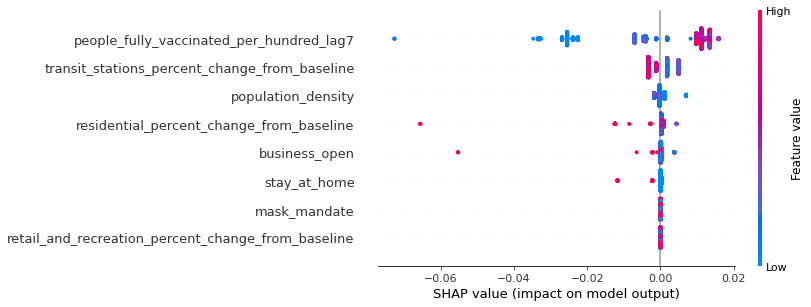

In [ ]:
explainer = shap.TreeExplainer(best_model)
shap_values = explainer(X_train)
shap.plots.beeswarm(shap_values)

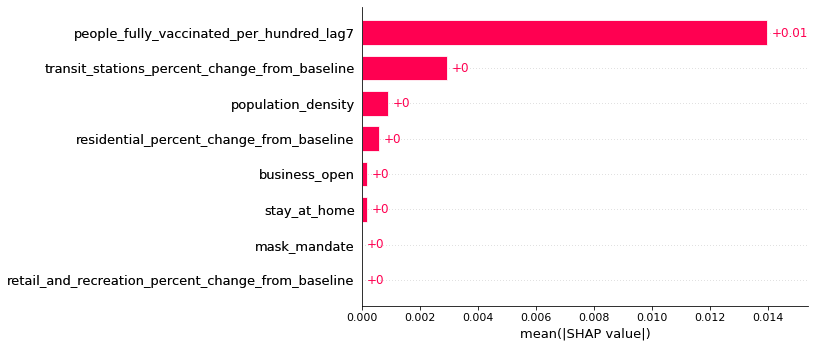

In [ ]:
shap.plots.bar(shap_values)

### Random forest

In [ ]:
X = data_without_na[c]
X_train, X_test, y_train, y_test = train_test_split(X, Y2, test_size=0.2, random_state=42)
rf = RandomForestRegressor()

In [ ]:
grid = {'n_estimators': range(200, 2001, 200),
               'max_features': ['auto', 'sqrt'],
               'max_depth': range(2, 15, 2),
               'min_samples_leaf': [1, 2, 4],
            'bootstrap': [True, False]}

In [ ]:
rf_random = RandomizedSearchCV(estimator = rf, param_distributions = grid, n_iter = 100, cv = 3, verbose=2, random_state=42, n_jobs = -2)

In [ ]:
rf_random.fit(X_train, y_train)

Fitting 3 folds for each of 100 candidates, totalling 300 fits
[CV] n_estimators=1200, min_samples_leaf=1, max_features=sqrt, max_depth=10, bootstrap=False 


[Parallel(n_jobs=-2)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  n_estimators=1200, min_samples_leaf=1, max_features=sqrt, max_depth=10, bootstrap=False, total=   3.7s
[CV] n_estimators=1200, min_samples_leaf=1, max_features=sqrt, max_depth=10, bootstrap=False 


[Parallel(n_jobs=-2)]: Done   1 out of   1 | elapsed:    3.7s remaining:    0.0s


[CV]  n_estimators=1200, min_samples_leaf=1, max_features=sqrt, max_depth=10, bootstrap=False, total=   3.6s
[CV] n_estimators=1200, min_samples_leaf=1, max_features=sqrt, max_depth=10, bootstrap=False 
[CV]  n_estimators=1200, min_samples_leaf=1, max_features=sqrt, max_depth=10, bootstrap=False, total=   3.6s
[CV] n_estimators=1400, min_samples_leaf=1, max_features=sqrt, max_depth=14, bootstrap=False 
[CV]  n_estimators=1400, min_samples_leaf=1, max_features=sqrt, max_depth=14, bootstrap=False, total=   5.5s
[CV] n_estimators=1400, min_samples_leaf=1, max_features=sqrt, max_depth=14, bootstrap=False 
[CV]  n_estimators=1400, min_samples_leaf=1, max_features=sqrt, max_depth=14, bootstrap=False, total=   5.4s
[CV] n_estimators=1400, min_samples_leaf=1, max_features=sqrt, max_depth=14, bootstrap=False 
[CV]  n_estimators=1400, min_samples_leaf=1, max_features=sqrt, max_depth=14, bootstrap=False, total=   5.5s
[CV] n_estimators=200, min_samples_leaf=1, max_features=sqrt, max_depth=2, boot

[Parallel(n_jobs=-2)]: Done 300 out of 300 | elapsed: 23.8min finished


RandomizedSearchCV(cv=3, error_score=nan,
                   estimator=RandomForestRegressor(bootstrap=True,
                                                   ccp_alpha=0.0,
                                                   criterion='mse',
                                                   max_depth=None,
                                                   max_features='auto',
                                                   max_leaf_nodes=None,
                                                   max_samples=None,
                                                   min_impurity_decrease=0.0,
                                                   min_impurity_split=None,
                                                   min_samples_leaf=1,
                                                   min_samples_split=2,
                                                   min_weight_fraction_leaf=0.0,
                                                   n_estimators=100,
                              

In [ ]:
rf_random.best_params_

{'bootstrap': True,
 'max_depth': 4,
 'max_features': 'sqrt',
 'min_samples_leaf': 2,
 'n_estimators': 2000}

In [ ]:
base_model = RandomForestRegressor(n_estimators = 10, random_state = 42)
base_model.fit(X_train, y_train)
y_pred = base_model.predict(X_test)
r2_score(y_test, y_pred)

-0.11372317517044972

In [ ]:
model = rf_random.best_estimator_
model.fit(X_train, y_train)
y_pred = model.predict(X_test)
r2_score(y_test, y_pred)

0.032031846536939246

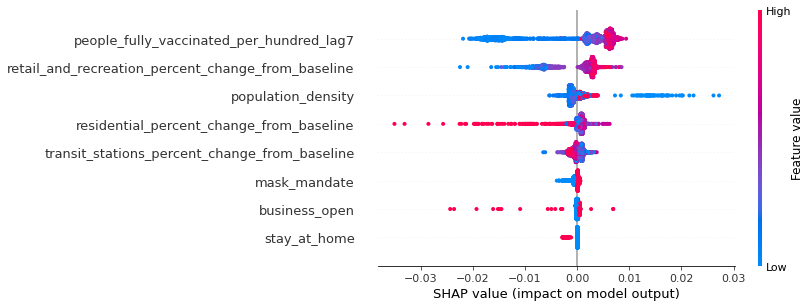

In [ ]:
explainer = shap.TreeExplainer(model)
shap_values = explainer(X_train)
shap.plots.beeswarm(shap_values)

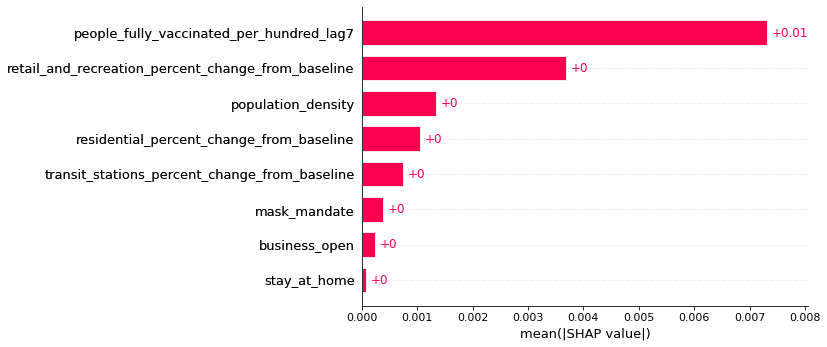

In [ ]:
shap.plots.bar(shap_values)

### SVM

In [ ]:
X = data_without_na[c]
X_train, X_test, y_train, y_test = train_test_split(X, Y2, test_size=0.2, random_state=42)

In [ ]:
for k in ["linear", "poly", "rbf", "sigmoid"]:
    regr = make_pipeline(StandardScaler(), SVR(kernel=k, C=1.0))
    regr.fit(X_train, y_train)
    y_pred = regr.predict(X_test)
    print(k, r2_score(y_test, y_pred))

linear 0.029384193165463257
poly -0.01882902019702426
rbf -0.03232500706040509
sigmoid -366563.1317986591


In [ ]:
for k in ["linear", "poly", "rbf", "sigmoid"]:
    regr = make_pipeline(RobustScaler(), SVR(kernel=k, C=1.0, epsilon=0.0001))
    regr.fit(X_train, y_train)
    y_pred = regr.predict(X_test)
    print(k, r2_score(y_test, y_pred))

linear 0.03991336579259719
poly 0.01745699541994783
rbf 0.05807587835763883
sigmoid -1394761.7813992177


In [ ]:
model = SVR(kernel="poly", C=1.0, epsilon=0.0001)
scaler = RobustScaler()
X = data_without_na[c]
X_scaled = scaler.fit_transform(X)
X_scaled_df = pd.DataFrame(X_scaled, columns = X.columns)
X_train, X_test, y_train, y_test = train_test_split(X_scaled_df, Y2, test_size=0.2, random_state=42)
model.fit(X_train, y_train)
y_pred = model.predict(X_test)
print(r2_score(y_test, y_pred))

0.018273862679367703


In [ ]:
explainer = shap.KernelExplainer(model.predict, X_train[:50])
shap_values = explainer.shap_values(X_test[:50], nsamples=100)

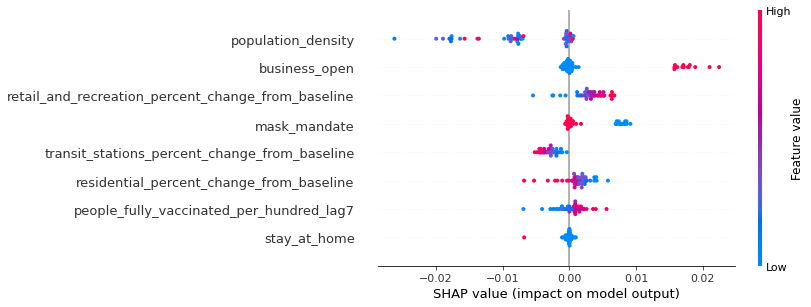

In [ ]:
shap.summary_plot(shap_values, X_test[:50])

### KNN

In [ ]:
from sklearn.neighbors import KNeighborsRegressor

In [ ]:
X = data_without_na[c]
X_scaled = scaler.fit_transform(X)
X_scaled_df = pd.DataFrame(X_scaled, columns = X.columns)
X_train, X_test, y_train, y_test = train_test_split(X_scaled_df, Y2, test_size=0.2, random_state=42)

In [ ]:
neigh = KNeighborsRegressor()

In [ ]:
grid = {"n_neighbors": range(2, 30), "weights": ["uniform", "distance"]}
neigh_random = GridSearchCV(estimator = neigh, param_grid = grid, cv = 3, n_jobs = -2)

In [ ]:
neigh_random.fit(X_train, y_train)

GridSearchCV(cv=3, error_score=nan,
             estimator=KNeighborsRegressor(algorithm='auto', leaf_size=30,
                                           metric='minkowski',
                                           metric_params=None, n_jobs=None,
                                           n_neighbors=5, p=2,
                                           weights='uniform'),
             iid='deprecated', n_jobs=-2,
             param_grid={'n_neighbors': range(2, 30),
                         'weights': ['uniform', 'distance']},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scoring=None, verbose=0)

In [ ]:
neigh_random.best_estimator_

KNeighborsRegressor(algorithm='auto', leaf_size=30, metric='minkowski',
                    metric_params=None, n_jobs=None, n_neighbors=29, p=2,
                    weights='distance')

In [ ]:
best_model = neigh_random.best_estimator_
model.fit(X_train, y_train)
y_pred = model.predict(X_test)
r2_score(y_test, y_pred)

0.018273862679367703

In [ ]:
explainer = shap.KernelExplainer(best_model.predict, X_train[:100])
shap_values = explainer.shap_values(X_test[:100])

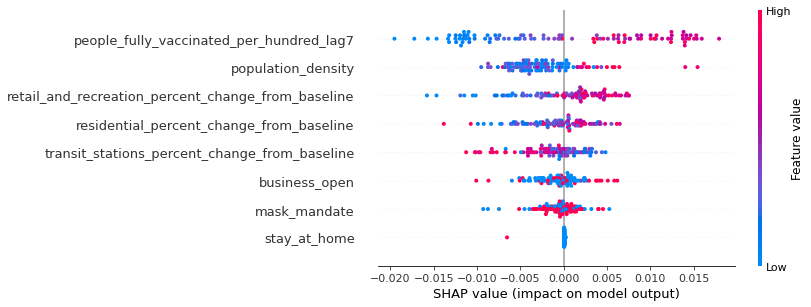

In [ ]:
shap.summary_plot(shap_values, X_test[:100])

## Transform Y to categorical data

In [ ]:
Y3 = Y2.copy()

In [ ]:
Y3[Y3<0] = 0
Y3[Y3>0] = 1
Y3[Y3==0] = "decrease"
Y3[Y3==1] = "increase"

### Logistic regression

In [ ]:
from sklearn.linear_model import LogisticRegression

In [ ]:
X = data_without_na[c]
X_scaled = scaler.fit_transform(X)
X_scaled_df = pd.DataFrame(X_scaled, columns = X.columns)
X_train, X_test, y_train, y_test = train_test_split(X_scaled_df, Y3, test_size=0.2, random_state=42)

In [ ]:
clf = LogisticRegression(random_state=42).fit(X_train, y_train)

In [ ]:
clf.score(X_test, y_test)

0.6410923276983095

In [ ]:
explainer = shap.LinearExplainer(clf, X_train)
shap_values = explainer.shap_values(X_test)

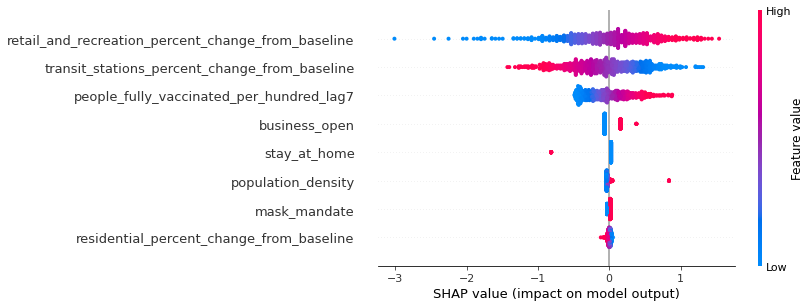

In [ ]:
shap.summary_plot(shap_values, X_test)

### Decision Trees

In [ ]:
from sklearn.tree import DecisionTreeClassifier

In [ ]:
X = data_without_na[c]
X_train, X_test, y_train, y_test = train_test_split(X, Y3, test_size=0.2, random_state=42)

In [ ]:
clf = DecisionTreeClassifier(random_state=42)

In [ ]:
grid = {'max_features': ['auto', 'sqrt'],
               'max_depth': range(2, 13),
               'min_samples_leaf': [1, 2, 4],}

In [ ]:
clf_random = GridSearchCV(estimator = clf, param_grid = grid, cv = 3, n_jobs = -2)
clf_random.fit(X_train, y_train)

GridSearchCV(cv=3, error_score=nan,
             estimator=DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None,
                                              criterion='gini', max_depth=None,
                                              max_features=None,
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              presort='deprecated',
                                              random_state=42,
                                              splitter='best'),
             iid='deprecated', n_jobs=-2,
             param_grid={'max_depth': range(2, 13),
                         'max_

In [ ]:
clf_random.best_estimator_

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=6, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=42, splitter='best')

In [ ]:
best_model = clf_random.best_estimator_
best_model.fit(X_train, y_train)
best_model.score(X_test, y_test)

0.6202860858257477

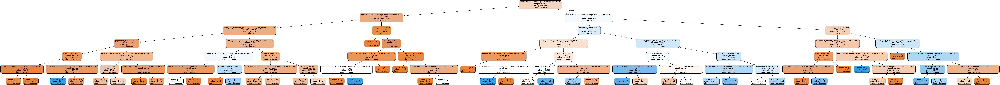

In [ ]:
from IPython.display import Image  
import pydotplus
thestring = tree.export_graphviz(best_model, out_file=None,  
                         feature_names=X_train.columns.values, 
                         class_names=['increase', 'decrease'],  
                         filled=True, rounded=True,  
                         special_characters=True,impurity=False)
graph = pydotplus.graph_from_dot_data(thestring)  
Image(graph.create_png())  

In [ ]:
explainer = shap.TreeExplainer(best_model)
shap_values = explainer.shap_values(X)

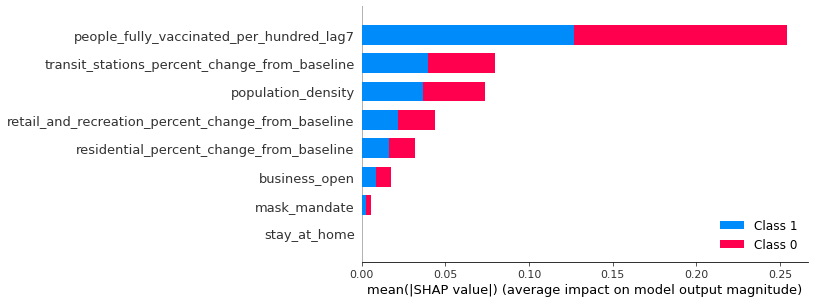

In [ ]:
shap.summary_plot(shap_values, X)

### Random forest

In [ ]:
from sklearn.ensemble import RandomForestClassifier

In [ ]:
X = data_without_na[c]
X_train, X_test, y_train, y_test = train_test_split(X, Y3, test_size=0.2, random_state=42)
clf = RandomForestClassifier()

In [ ]:
grid = {'n_estimators': range(200, 2001, 200),
               'max_features': ['auto', 'sqrt'],
               'max_depth': range(2, 15, 2),
               'min_samples_leaf': [1, 2, 4],
            'bootstrap': [True, False]}

In [ ]:
clf_random = RandomizedSearchCV(estimator = clf, param_distributions = grid, n_iter = 100, cv = 3, verbose=2, random_state=42, n_jobs = -2)
clf_random.fit(X_train, y_train)

Fitting 3 folds for each of 100 candidates, totalling 300 fits
[CV] n_estimators=1200, min_samples_leaf=1, max_features=sqrt, max_depth=10, bootstrap=False 


[Parallel(n_jobs=-2)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  n_estimators=1200, min_samples_leaf=1, max_features=sqrt, max_depth=10, bootstrap=False, total=   4.0s
[CV] n_estimators=1200, min_samples_leaf=1, max_features=sqrt, max_depth=10, bootstrap=False 


[Parallel(n_jobs=-2)]: Done   1 out of   1 | elapsed:    4.0s remaining:    0.0s


[CV]  n_estimators=1200, min_samples_leaf=1, max_features=sqrt, max_depth=10, bootstrap=False, total=   4.0s
[CV] n_estimators=1200, min_samples_leaf=1, max_features=sqrt, max_depth=10, bootstrap=False 
[CV]  n_estimators=1200, min_samples_leaf=1, max_features=sqrt, max_depth=10, bootstrap=False, total=   3.9s
[CV] n_estimators=1400, min_samples_leaf=1, max_features=sqrt, max_depth=14, bootstrap=False 
[CV]  n_estimators=1400, min_samples_leaf=1, max_features=sqrt, max_depth=14, bootstrap=False, total=   5.5s
[CV] n_estimators=1400, min_samples_leaf=1, max_features=sqrt, max_depth=14, bootstrap=False 
[CV]  n_estimators=1400, min_samples_leaf=1, max_features=sqrt, max_depth=14, bootstrap=False, total=   5.5s
[CV] n_estimators=1400, min_samples_leaf=1, max_features=sqrt, max_depth=14, bootstrap=False 
[CV]  n_estimators=1400, min_samples_leaf=1, max_features=sqrt, max_depth=14, bootstrap=False, total=   5.6s
[CV] n_estimators=200, min_samples_leaf=1, max_features=sqrt, max_depth=2, boot

[Parallel(n_jobs=-2)]: Done 300 out of 300 | elapsed: 15.8min finished


RandomizedSearchCV(cv=3, error_score=nan,
                   estimator=RandomForestClassifier(bootstrap=True,
                                                    ccp_alpha=0.0,
                                                    class_weight=None,
                                                    criterion='gini',
                                                    max_depth=None,
                                                    max_features='auto',
                                                    max_leaf_nodes=None,
                                                    max_samples=None,
                                                    min_impurity_decrease=0.0,
                                                    min_impurity_split=None,
                                                    min_samples_leaf=1,
                                                    min_samples_split=2,
                                                    min_weight_fraction_leaf=0.0,
               

In [ ]:
clf_random.best_params_

{'bootstrap': False,
 'max_depth': 6,
 'max_features': 'sqrt',
 'min_samples_leaf': 4,
 'n_estimators': 2000}

In [ ]:
best_model = clf_random.best_estimator_
best_model.fit(X_train, y_train)
best_model.score(X_test, y_test)

0.6905071521456437

In [ ]:
explainer = shap.TreeExplainer(best_model)
shap_values = explainer.shap_values(X)

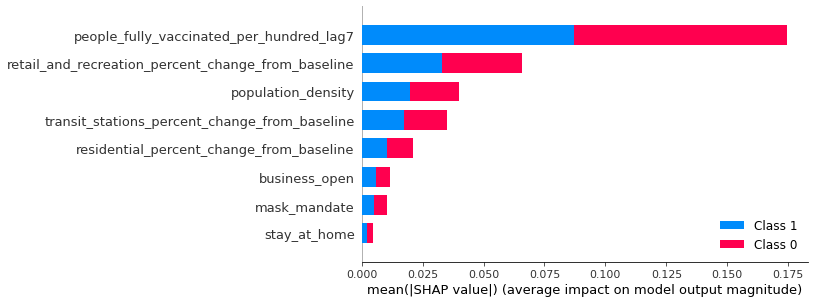

In [ ]:
shap.summary_plot(shap_values, X)

### SVM

In [ ]:
from sklearn.svm import SVC

In [ ]:
for k in ["linear", "poly", "rbf", "sigmoid"]:
    clf = make_pipeline(RobustScaler(), SVC(kernel=k, C=1.0, probability=True))
    clf.fit(X_train, y_train)
    print(k, clf.score(X_test, y_test))

linear 0.6540962288686606
poly 0.6228868660598179
rbf 0.611183355006502
sigmoid 0.5201560468140443


In [ ]:
model = SVC(kernel="rbf", C=1.0, probability=True)
scaler = RobustScaler()
X = data_without_na[c]
X_scaled = scaler.fit_transform(X)
X_scaled_df = pd.DataFrame(X_scaled, columns = X.columns)
X_train, X_test, y_train, y_test = train_test_split(X_scaled_df, Y3, test_size=0.2, random_state=42)
model.fit(X_train, y_train)
model.score(X_test, y_test)

0.6150845253576073

In [ ]:
explainer = shap.KernelExplainer(model.predict_proba, X_train[:50])
shap_values = explainer.shap_values(X_test[:50], nsamples=100)

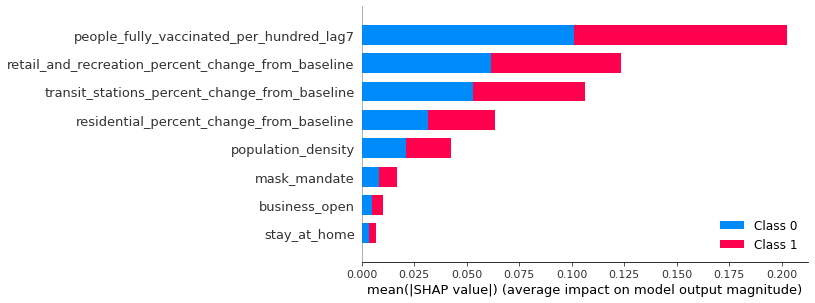

In [ ]:
shap.summary_plot(shap_values, X_test[:50])

### KNN

In [ ]:
from sklearn.neighbors import KNeighborsClassifier

In [ ]:
X = data_without_na[c]
X_scaled = scaler.fit_transform(X)
X_scaled_df = pd.DataFrame(X_scaled, columns = X.columns)
X_train, X_test, y_train, y_test = train_test_split(X_scaled_df, Y3, test_size=0.2, random_state=42)

In [ ]:
neigh = KNeighborsClassifier()

In [ ]:
grid = {"n_neighbors": range(2, 30), "weights": ["uniform", "distance"]}
neigh_random = GridSearchCV(estimator = neigh, param_grid = grid, cv = 3, n_jobs = -2)
neigh_random.fit(X_train, y_train)

GridSearchCV(cv=3, error_score=nan,
             estimator=KNeighborsClassifier(algorithm='auto', leaf_size=30,
                                            metric='minkowski',
                                            metric_params=None, n_jobs=None,
                                            n_neighbors=5, p=2,
                                            weights='uniform'),
             iid='deprecated', n_jobs=-2,
             param_grid={'n_neighbors': range(2, 30),
                         'weights': ['uniform', 'distance']},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scoring=None, verbose=0)

In [ ]:
neigh_random.best_estimator_

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=None, n_neighbors=16, p=2,
                     weights='uniform')

In [ ]:
best_model = neigh_random.best_estimator_
model.fit(X_train, y_train)
best_model.score(X_test, y_test)

0.647594278283485

In [ ]:
explainer = shap.KernelExplainer(best_model.predict_proba, X_train[:100])
shap_values = explainer.shap_values(X_test[:100])

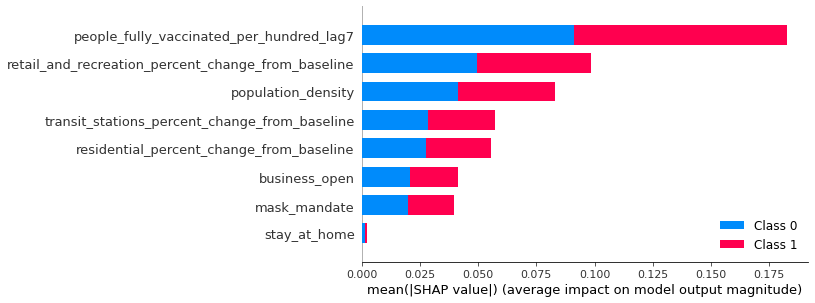

In [ ]:
shap.summary_plot(shap_values, X_test[:100])

## Deep learning model